In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt

# import required libraries for clustering
import sklearn
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from scipy.cluster.hierarchy import linkage
from scipy.cluster.hierarchy import dendrogram
from scipy.cluster.hierarchy import cut_tree


In [2]:
from __future__ import division
import plotly.offline as pyoff
import plotly.graph_objs as go

In [51]:

from sklearn.datasets import make_blobs
from sklearn.datasets import make_gaussian_quantiles
from sklearn.datasets import make_classification, make_regression

import pandas as pd
import numpy as np
import argparse
import json
import re
import os
import sys
import plotly
import plotly.graph_objs as go
plotly.offline.init_notebook_mode()

# Шаг 1. Чтение и понимание данных

## Что такое сегментация клиентов?
Сегментация клиентов - это метод разделения клиентов на группы или кластеры на основе общих характеристик. Исследователь рынка может сегментировать клиентов в модели B2C, используя различные демографические характеристики клиентов, такие как род занятий, пол, возраст, местоположение и семейное положение. Психографические характеристики, такие как социальный класс,
характеристики образа жизни и личности и поведенческие характеристики, такие как расходы, привычки потребления, использование продуктов / услуг и ранее приобретенные продукты. В модели B2B используются различные характеристики компании, такие как размер компании, тип отрасли и местоположение.
#### Необходимость сегментации клиентов
- Это поможет выявить наиболее потенциальных клиентов.
- Поможет менеджерам легко общаться с группами целевой аудитории.
- Кроме того, поможет выбрать лучшую среду для связи с целевым сегментом.
- Это улучшет качество обслуживания, лояльность и удержание.
- Улучшение отношений с клиентами за счет лучшего понимания потребностей сегментов.
- Предоставит возможность для дополнительных продаж.
- Это поможет менеджерам разработать специальные предложения для целевых клиентов, чтобы побудить их покупать больше товаров.
- Это поможет компании быть на шаг впереди конкурентов.
- Это также поможет определить новые продукты, которые могут быть интересны клиентам.

### Сегментация клиентов с использованием RFM-анализа
RFM (Recency, Frequency, Monetary) анализ - это основанный на поведении подход, группирующий клиентов по сегментам. Он группирует клиентов на основе их предыдущих транзакций покупки. Как давно, как часто и сколько покупал клиент.
RFM фильтрует клиентов по различным группам с целью лучшего обслуживания. Это помогает менеджерам определять потенциальных клиентов, и индивидуально взаимодействовать с каждым. 
Предположим, у компании есть сегмент клиентов, которые много тратят, но сделали заказ только один раз или последняя покупка была достаточно давно? Часто ли они делают заказы? Сегментация клиентов с использованием RFM-анализа помогает менеджерам проводить эффективную рекламную кампанию для персонализированного обслуживания.

- Недавность (Recency): Кто покупал недавно? Количество дней с момента последней покупки (наименьшая давность)
- Частота (Frequency): Кто покупает часто? Это означает общее количество покупок. ( высокая частота)
- Денежная стоимость (Monetary): У кого большая сумма покупок? Это означает общую сумму денег, потраченных клиентом (высокая денежная оценка).

Здесь каждая из трех переменных (недавнее посещение, частота и денежное выражение) состоит из четырех равных групп, что создает 64 (4x4x4) различных клиентских сегмента.

###### Шаги RFM (недавность, частота, денежный перевод):

1. Рассчитать давность, частоту, денежное выражение для каждого покупателя.
2. Добавить значения интервалов сегмента в таблицу RFM, используя квартиль.
3. Отсортировать оценки RFM клиентов в порядке возрастания.



#### На входе : 
 - id заказа, id клиента, сумма заказа, время заказа
 - Данные за промежуток времени: 2020-05-21 по 2021-02-21
 
#### На выходе : 
 - Таблица с id клиента, id кластера, оценка клиента

In [52]:
retail = pd.read_csv('frfr.csv')
retail.head()

,OrderID,CustomerID,Amount,Created_at
0,9606727,35000.0,925.0,2020-01-01 18:56
1,9606913,2709788.0,1545.0,2020-01-01 22:11
2,9607094,19212.0,1950.0,2020-01-02 08:04
3,9607144,1694062.0,603.0,2020-01-02 08:32
4,9607241,2156661.0,1090.0,2020-01-02 09:04


In [53]:
# df info

retail.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 4 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   OrderID     100000 non-null  object 
 1   CustomerID  99998 non-null   float64
 2   Amount      99998 non-null   float64
 3   Created_at  99998 non-null   object 
dtypes: float64(2), object(2)
memory usage: 3.1+ MB


In [54]:
# df description

retail.describe()

,CustomerID,Amount
count,9.999800e+04,99998.000000
mean,1.675082e+06,979.598227
std,8.919875e+05,557.162270
min,2.254000e+03,0.000000
25%,9.301530e+05,594.000000
50%,1.790523e+06,900.000000
75%,2.498435e+06,1190.000000
max,3.471076e+06,12922.000000


## Шаг 2 : Очистка данных
Расчет недостающих значений в процентном соотношении  в DF

In [55]:


df_null = round(100*(retail.isnull().sum())/len(retail), 2)
df_null

OrderID       0.0
CustomerID    0.0
Amount        0.0
Created_at    0.0
dtype: float64

In [56]:
# Очистка от строк с пропущенными значениями 

retail = retail.dropna()
retail.shape

(99998, 4)

In [57]:
# Изменение типа данных для ID Клиента 
retail['CustomerID'] = retail['CustomerID'].astype(str)

## Шаг 3: Подготовка данных

Мы собираемся анализировать клиентов на основе следующих трех факторов:
- R (Recency) количество дней с момента последней покупки клиента.
- F (Frequency): количество заказов клиента.
- M (Monetary): общая сумма транзакций клента.

In [60]:
# Добавим новый атрибут : Monetary

# retail['Amount'] = retail['cash_price']
rfm_m = retail.groupby('CustomerID')['Amount'].sum()
rfm_m = rfm_m.reset_index()
rfm_m.head()

,CustomerID,Amount
0,1000037.0,1600.0
1,1000052.0,4010.0
2,100008.0,3994.0
3,1000093.0,645.0
4,1000143.0,5849.0


In [61]:
# Добавим новый атрибут : Frequency

rfm_f = retail.groupby('CustomerID')['OrderID'].count()
rfm_f = rfm_f.reset_index()
rfm_f.columns = ['CustomerID', 'Frequency']
rfm_f.head()

,CustomerID,Frequency
0,1000037.0,2
1,1000052.0,3
2,100008.0,5
3,1000093.0,1
4,1000143.0,5


In [62]:
# Объединим две таблиы данных

rfm = pd.merge(rfm_m, rfm_f, on='CustomerID', how='inner')
rfm.head()

,CustomerID,Amount,Frequency
0,1000037.0,1600.0,2
1,1000052.0,4010.0,3
2,100008.0,3994.0,5
3,1000093.0,645.0,1
4,1000143.0,5849.0,5


In [63]:
# Добавим новый атрибут : Recency

# Сделаем конвертацию даты в нужный формат для дальнейшей работы

retail['Created_at'] = pd.to_datetime(retail['Created_at'],format='%Y-%m-%d %H:%M')

Чтобы рассчитать давность, нам нужно узнать дату последней покупки каждого клиента, а так же сколько дней они неактивны.


In [64]:
# Вычислим время самой последней транзакции для каждого клиента

max_date = max(retail['Created_at'])
max_date

Timestamp('2020-04-10 17:01:00')

In [65]:
# Вычислим для всех заказов разницу между временем создания заказа и временем создания последнего заказа

retail['Diff'] = max_date - retail['Created_at']
retail.head()

,OrderID,CustomerID,Amount,Created_at,Diff
0,9606727,35000.0,925.0,2020-01-01 18:56:00,99 days 22:05:00
1,9606913,2709788.0,1545.0,2020-01-01 22:11:00,99 days 18:50:00
2,9607094,19212.0,1950.0,2020-01-02 08:04:00,99 days 08:57:00
3,9607144,1694062.0,603.0,2020-01-02 08:32:00,99 days 08:29:00
4,9607241,2156661.0,1090.0,2020-01-02 09:04:00,99 days 07:57:00


In [66]:
#  Вычислим Recency, "давность оформления заказа" для каждого клиента

rfm_p = retail.groupby('CustomerID')['Diff'].min()
rfm_p = rfm_p.reset_index()
rfm_p.head()


,CustomerID,Diff
0,1000037.0,7 days 00:12:00
1,1000052.0,2 days 04:58:00
2,100008.0,0 days 01:48:00
3,1000093.0,86 days 23:48:00
4,1000143.0,5 days 02:35:00


In [67]:
# Посчитаем в днях

rfm_p['Diff'] = rfm_p['Diff'].dt.days
rfm_p.head()

,CustomerID,Diff
0,1000037.0,7
1,1000052.0,2
2,100008.0,0
3,1000093.0,86
4,1000143.0,5


In [68]:
# Объединим таблицы в целое, получим RFM таблицу
rfm = pd.merge(rfm, rfm_p, on='CustomerID', how='inner')
rfm.columns = ['CustomerID', 'Amount', 'Frequency', 'Recency']
rfm.head()

,CustomerID,Amount,Frequency,Recency
0,1000037.0,1600.0,2,7
1,1000052.0,4010.0,3,2
2,100008.0,3994.0,5,0
3,1000093.0,645.0,1,86
4,1000143.0,5849.0,5,5


In [69]:
plot_data = [
    go.Histogram(
        x=rfm['Recency']
    )
]

plot_layout = go.Layout(
        title='Recency'
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)

In [70]:
plot_data = [
    go.Histogram(
        x=rfm['Frequency']
    )
]

plot_layout = go.Layout(
        title='Frequency'
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)

In [71]:
plot_data = [
    go.Histogram(
        x=rfm['Amount']
    )
]

plot_layout = go.Layout(
        title='Amount'
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)

In [72]:
rfm.describe()

,Amount,Frequency,Recency
count,49049.000000,49049.000000,49049.000000
mean,1997.142929,2.038737,41.401721
std,1925.898213,2.580835,27.917472
min,0.000000,1.000000,0.000000
25%,896.000000,1.000000,18.000000
50%,1317.000000,1.000000,37.000000
75%,2415.000000,2.000000,62.000000
max,57544.000000,302.000000,99.000000


Вычисление квантиля значений RFM
Клиенты с самой низкой давностью, самой высокой частотой и денежными суммами считаются главными клиентами.

qcut () - функция дискретизации на основе квантилей. qcut разделяет данные на основе квантилей выборки. Например,
1000 значений для 4 квантилей создадут категориальный объект, указывающий членство в квантиле для каждого клиента.

In [73]:
rfm['r_quartile'] = pd.qcut(rfm['Recency'], 4, ['1','2','3','4'], duplicates='drop')
rfm['f_quartile'] = pd.cut(rfm['Frequency'], bins=[0,1,2,5,rfm['Frequency'].max()], labels=['4','3','2','1'])
rfm['m_quartile'] = pd.qcut(rfm['Amount'], 4, ['4','3','2','1'], duplicates='drop')

In [74]:
rfm.head()

,CustomerID,Amount,Frequency,Recency,r_quartile,f_quartile,m_quartile
0,1000037.0,1600.0,2,7,1,3,2
1,1000052.0,4010.0,3,2,1,2,1
2,100008.0,3994.0,5,0,1,2,1
3,1000093.0,645.0,1,86,4,4,4
4,1000143.0,5849.0,5,5,1,2,1


### Интерпретация результатов RFM
Объединим все три квартиля (r_quartile, f_quartile, m_quartile) в одном столбце, этот рейтинг поможет нам хорошо сегментировать группу клиентов.

- Низкая ценность: клиенты, которые менее активны, чем другие, не очень частые покупатели / посетители и приносят очень низкий нулевой - возможно, отрицательный доход.
- Средняя ценность: часто используют нашу платформу (но не так часто, как покупатели высокой ценности), приносят умеренный доход.
- Высокая ценность: группа, которую мы не хотим терять. Высокий доход, Частота и низкий уровень бездействия.

In [75]:
rfm['RFM_Score'] = rfm.r_quartile.astype(str)+ rfm.f_quartile.astype(str) + rfm.m_quartile.astype(str)
rfm.head()

,CustomerID,Amount,Frequency,Recency,r_quartile,f_quartile,m_quartile,RFM_Score
0,1000037.0,1600.0,2,7,1,3,2,132
1,1000052.0,4010.0,3,2,1,2,1,121
2,100008.0,3994.0,5,0,1,2,1,121
3,1000093.0,645.0,1,86,4,4,4,444
4,1000143.0,5849.0,5,5,1,2,1,121


In [76]:
# Filter out Top/Best cusotmers
rfm[rfm['RFM_Score']=='111'].sort_values('Amount', ascending=False).head()

,CustomerID,Amount,Frequency,Recency,r_quartile,f_quartile,m_quartile,RFM_Score
14044,2004504.0,57544.0,302,1,1,1,1,111
44460,646576.0,36936.0,37,0,1,1,1,111
22640,2479664.0,35348.0,21,3,1,1,1,111
22228,2457510.0,35093.0,194,12,1,1,1,111
44937,678584.0,32657.0,21,9,1,1,1,111


### Есть 2 типа выбросов, которые мы будем обрабатывать:
- Статистический
- Зависящий от домена


Text(0.5, 0, 'Attributes')

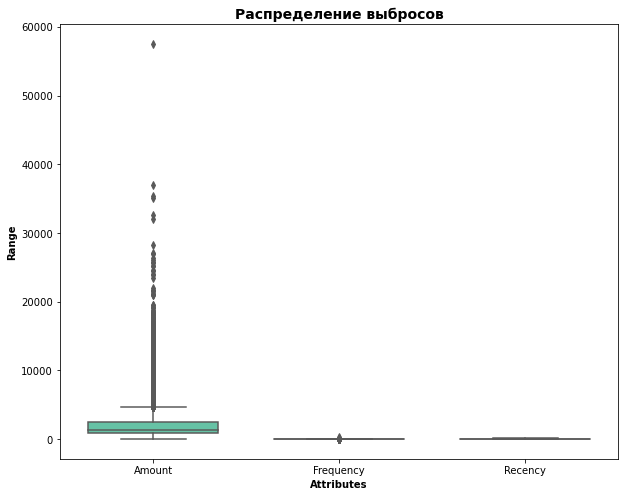

In [77]:

# Анализ выбросов

attributes = ['Amount','Frequency','Recency']
plt.rcParams['figure.figsize'] = [10,8]
sns.boxplot(data = rfm[attributes], orient="v", palette="Set2" ,whis=1.5,saturation=1, width=0.7)
plt.title("Распределение выбросов", fontsize = 14, fontweight = 'bold')
plt.ylabel("Range", fontweight = 'bold')
plt.xlabel("Attributes", fontweight = 'bold')

In [78]:
# Удаление выбросов для Amount
Q1 = rfm.Amount.quantile(0.05)
Q3 = rfm.Amount.quantile(0.95)
IQR = Q3 - Q1
rfm = rfm[(rfm.Amount >= Q1 - 1.5*IQR) & (rfm.Amount <= Q3 + 1.5*IQR)]

# Удаление выбросов Recency
Q1 = rfm.Recency.quantile(0.05)
Q3 = rfm.Recency.quantile(0.95)
IQR = Q3 - Q1
rfm = rfm[(rfm.Recency >= Q1 - 1.5*IQR) & (rfm.Recency <= Q3 + 1.5*IQR)]

# Удаление выбросов для Frequency
Q1 = rfm.Frequency.quantile(0.05)
Q3 = rfm.Frequency.quantile(0.95)
IQR = Q3 - Q1
rfm = rfm[(rfm.Frequency >= Q1 - 1.5*IQR) & (rfm.Frequency <= Q3 + 1.5*IQR)]

### Изменение масштаба атрибутов
 важно изменить масштаб переменных, чтобы они имели сопоставимый масштаб. Есть два распространенных способа изменения масштаба:

- Минимакс масштабирование
- Стандартизация (среднее-0, сигма-1)
Будем использовать стандартизацию.
Цель — преобразовать исходный набор в новый со средним значением равным 0 и стандартным отклонением равным 1.

In [79]:
# Изменение масштаба

rfm_df = rfm[['Amount', 'Frequency', 'Recency']]


scaler = StandardScaler()

# fit_transform
rfm_df_scaled = scaler.fit_transform(rfm_df)
rfm_df_scaled.shape

(48714, 3)

In [80]:
rfm_df_scaled = pd.DataFrame(rfm_df_scaled)
rfm_df_scaled.columns = ['Amount', 'Frequency', 'Recency']
rfm_df_scaled.head()

,Amount,Frequency,Recency
0,-0.197192,0.038704,-1.242548
1,1.269266,0.675028,-1.421965
2,1.259530,1.947676,-1.493732
3,-0.778299,-0.597620,1.592238
4,2.388277,1.947676,-1.314315


Мы собираемся применить кластеризацию K-средних, чтобы присвоить оценку новизны. 

# Шаг 4: Создание моделей 
# K-Means кластеризация

Алгоритм работает следующим образом:
Сначала мы случайным образом выбираем k точек
Мы классифицируем каждый элемент по ближайшему среднему значению и обновляем координаты среднего значения, которые представляют собой средние значения элементов, отнесенных к этому среднему значению на данный момент.
Мы повторяем процесс для заданного количества итераций, и в конце получаем кластеры

In [81]:
# k-means 

kmeans = KMeans(n_clusters=4, max_iter=300)
kmeans.fit(rfm_df_scaled)

KMeans(n_clusters=4)

In [82]:
kmeans.labels_

array([0, 3, 3, ..., 3, 3, 1])

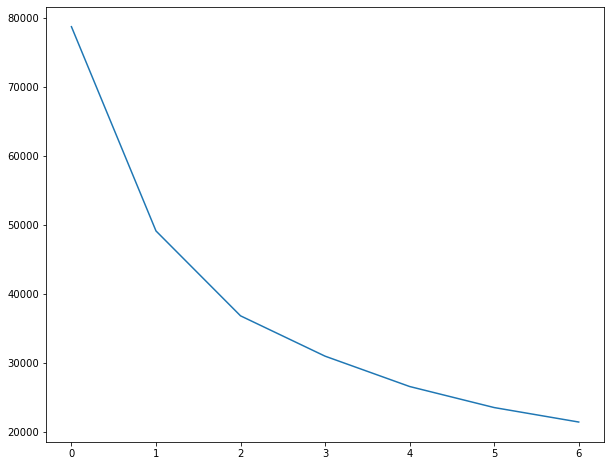

In [83]:
# Нахождение оптимального количества кластеров

# Метод локтя является эвристическим используемым в определении количества кластеров в наборе данных.
# Метод состоит из построения объясненного изменения как функции количества кластеров и выбора изгиба кривой
# в качестве количества используемых кластеров

# Elbow-curve/SSD

ssd = []
range_n_clusters = [2, 3, 4, 5, 6, 7, 8]
for num_clusters in range_n_clusters:
    kmeans = KMeans(n_clusters=num_clusters, max_iter=50)
    kmeans.fit(rfm_df_scaled)
    
    ssd.append(kmeans.inertia_)
    
# plot the SSDs for each n_clusters
plt.plot(ssd)

### Silhouette Analysis

$$\text{silhouette score}=\frac{p-q}{max(p,q)}$$
* Силуэт относится к методу интерпретации и проверки согласованности в пределах кластеров данных . Этот метод дает краткое графическое представление о том, насколько хорошо каждый объект был классифицирован. Значение силуэта является мерой того, насколько объект похож на его собственный кластер (сцепление) по сравнению с другими кластерами (разделение). Силуэт находится в диапазоне от -1 до +1, где высокое значение указывает, что объект хорошо соответствует своему собственному кластеру и плохо соответствует соседним кластерам. Если большинство объектов имеют высокое значение, то конфигурация кластеризации подходит. Если многие точки имеют низкое или отрицательное значение, то в конфигурации кластеризации может быть слишком много или слишком мало кластеров. Силуэт можно рассчитать с помощью любой метрики расстояния , такой как евклидово расстояние или манхэттенское расстояние

In [84]:
# модель с  k=4
kmeans = KMeans(n_clusters=4, max_iter=50)
kmeans.fit(rfm_df_scaled)


KMeans(max_iter=50, n_clusters=4)

In [85]:
#build 4 clusters for recency and add it to dataframe
kmeans = KMeans(n_clusters=4)
kmeans.fit(rfm[['Recency']])
rfm['RecencyCluster'] = kmeans.predict(rfm[['Recency']])

#function for ordering cluster numbers
def order_cluster(cluster_field_name, target_field_name,df,ascending):
    new_cluster_field_name = 'new_' + cluster_field_name
    df_new = df.groupby(cluster_field_name)[target_field_name].mean().reset_index()
    df_new = df_new.sort_values(by=target_field_name,ascending=ascending).reset_index(drop=True)
    df_new['index'] = df_new.index
    df_final = pd.merge(df,df_new[[cluster_field_name,'index']], on=cluster_field_name)
    df_final = df_final.drop([cluster_field_name],axis=1)
    df_final = df_final.rename(columns={"index":cluster_field_name})
    return df_final

rfm = order_cluster('RecencyCluster', 'Recency',rfm,False)
rfm.groupby('RecencyCluster')['Recency'].describe()

,count,mean,std,min,25%,50%,75%,max
RecencyCluster,,,,,,,,
0,9223.0,84.876613,8.177464,71.0,77.0,84.0,92.0,99.0
1,12030.0,56.285370,7.459143,45.0,49.0,56.0,62.0,70.0
2,13025.0,32.605605,6.029673,22.0,27.0,33.0,37.0,44.0
3,14436.0,9.921031,6.784199,0.0,4.0,9.0,16.0,21.0


In [86]:
#build 4 clusters for recency and add it to dataframe
kmeans = KMeans(n_clusters=4)
kmeans.fit(rfm[['Frequency']])
rfm['FrequencyCluster'] = kmeans.predict(rfm[['Frequency']])

#function for ordering cluster numbers
def order_cluster(cluster_field_name, target_field_name,df,ascending):
    new_cluster_field_name = 'new_' + cluster_field_name
    df_new = df.groupby(cluster_field_name)[target_field_name].mean().reset_index()
    df_new = df_new.sort_values(by=target_field_name,ascending=ascending).reset_index(drop=True)
    df_new['index'] = df_new.index
    df_final = pd.merge(df,df_new[[cluster_field_name,'index']], on=cluster_field_name)
    df_final = df_final.drop([cluster_field_name],axis=1)
    df_final = df_final.rename(columns={"index":cluster_field_name})
    return df_final

rfm = order_cluster('FrequencyCluster', 'Recency',rfm,False)
rfm.groupby('FrequencyCluster')['Frequency'].describe()

,count,mean,std,min,25%,50%,75%,max
FrequencyCluster,,,,,,,,
0,28343.0,1.000000,0.00000,1.0,1.0,1.0,1.0,1.0
1,14263.0,2.324195,0.46809,2.0,2.0,2.0,3.0,3.0
2,4821.0,4.670400,0.77020,4.0,4.0,4.0,5.0,6.0
3,1287.0,8.124320,1.25085,7.0,7.0,8.0,9.0,11.0


In [87]:
#apply clustering
kmeans = KMeans(n_clusters=4)
kmeans.fit(rfm[['Amount']])
rfm['MonetaryCluster'] = kmeans.predict(rfm[['Amount']])


#order the cluster numbers
rfm = order_cluster('MonetaryCluster', 'Amount',rfm,True)

#show details of the dataframe
rfm.groupby('MonetaryCluster')['Amount'].describe()


,count,mean,std,min,25%,50%,75%,max
MonetaryCluster,,,,,,,,
0,29962.0,983.397704,354.240027,0.0,685.0,998.0,1209.0,1716.0
1,12504.0,2444.524472,502.837157,1717.0,2018.0,2351.0,2823.0,3552.0
2,4963.0,4646.473907,799.794690,3553.0,3956.5,4485.0,5259.0,6469.0
3,1285.0,8278.400000,1504.090081,6473.0,7071.0,7878.0,9128.0,13027.0


In [88]:
rfm.describe()

,Amount,Frequency,Recency,RecencyCluster,FrequencyCluster,MonetaryCluster
count,48714.000000,48714.000000,48714.000000,48714.000000,48714.000000,48714.000000
mean,1924.068851,1.939176,41.627417,1.670731,0.569980,0.539578
std,1643.432051,1.571543,27.868350,1.091887,0.775605,0.781331
min,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,890.000000,1.000000,19.000000,1.000000,0.000000,0.000000
50%,1300.000000,1.000000,37.000000,2.000000,0.000000,0.000000
75%,2389.000000,2.000000,62.000000,3.000000,1.000000,1.000000
max,13027.000000,11.000000,99.000000,3.000000,3.000000,3.000000


In [89]:
#calculate overall score and use mean() to see details
rfm['OverallScore'] = rfm['RecencyCluster'] + rfm['FrequencyCluster'] + rfm['MonetaryCluster']
rfm.groupby('OverallScore')['Recency','Frequency','Amount'].mean()


<ipython-input-89-440fc3320f62>:3: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



,Recency,Frequency,Amount
OverallScore,,,
0,85.452278,1.000000,908.948210
1,60.415027,1.062399,1044.375318
2,41.534539,1.220042,1215.322251
3,26.442913,1.461636,1473.367103
4,26.638531,2.275303,2250.479289
5,17.018809,2.761894,2853.442797
6,17.709842,4.076268,3994.853004
7,11.474453,5.014112,4984.226277
8,10.822506,6.816705,6667.381671


### Приведенная выше оценка ясно показывает, что клиенты с 9 баллами - наши лучшие клиенты, а 0 - худшие.
Чтобы не усложнять задачу, лучше назовем эти оценки:
От 0 до 2: низкое значение
От 3 до 4: среднее значение
5+: высокая ценность


In [90]:
rfm['Segment'] = 'Low-Value'
rfm.loc[rfm['OverallScore']>2,'Segment'] = 'Mid-Value' 
rfm.loc[rfm['OverallScore']>4,'Segment'] = 'High-Value' 

Давайте посмотрим, как наши сегменты распределяются на диаграмме рассеяния:

In [91]:
#Amount vs Frequency
tx_graph = rfm.query("Amount < 50000 and Frequency < 2000")

plot_data = [
    go.Scatter(
        x=tx_graph.query("Segment == 'Low-Value'")['Frequency'],
        y=tx_graph.query("Segment == 'Low-Value'")['Amount'],
        mode='markers',
        name='Low',
        marker= dict(size= 7,
            line= dict(width=1),
            color= 'blue',
            opacity= 0.8
           )
    ),
        go.Scatter(
        x=tx_graph.query("Segment == 'Mid-Value'")['Frequency'],
        y=tx_graph.query("Segment == 'Mid-Value'")['Amount'],
        mode='markers',
        name='Mid',
        marker= dict(size= 9,
            line= dict(width=1),
            color= 'green',
            opacity= 0.5
           )
    ),
        go.Scatter(
        x=tx_graph.query("Segment == 'High-Value'")['Frequency'],
        y=tx_graph.query("Segment == 'High-Value'")['Amount'],
        mode='markers',
        name='High',
        marker= dict(size= 11,
            line= dict(width=1),
            color= 'red',
            opacity= 0.9
           )
    ),
]

plot_layout = go.Layout(
        yaxis= {'title': "Amount"},
        xaxis= {'title': "Frequency"},
        title='Segments'
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)


In [92]:
#Amount Recency

tx_graph = rfm.query("Amount < 50000 and Frequency < 2000")

plot_data = [
    go.Scatter(
        x=tx_graph.query("Segment == 'Low-Value'")['Recency'],
        y=tx_graph.query("Segment == 'Low-Value'")['Amount'],
        mode='markers',
        name='Low',
        marker= dict(size= 7,
            line= dict(width=1),
            color= 'blue',
            opacity= 0.8
           )
    ),
        go.Scatter(
        x=tx_graph.query("Segment == 'Mid-Value'")['Recency'],
        y=tx_graph.query("Segment == 'Mid-Value'")['Amount'],
        mode='markers',
        name='Mid',
        marker= dict(size= 9,
            line= dict(width=1),
            color= 'green',
            opacity= 0.5
           )
    ),
        go.Scatter(
        x=tx_graph.query("Segment == 'High-Value'")['Recency'],
        y=tx_graph.query("Segment == 'High-Value'")['Amount'],
        mode='markers',
        name='High',
        marker= dict(size= 11,
            line= dict(width=1),
            color= 'red',
            opacity= 0.9
           )
    ),
]

plot_layout = go.Layout(
        yaxis= {'title': "Amount"},
        xaxis= {'title': "Recency"},
        title='Segments'
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)



In [93]:
# Recency vs Frequency
tx_graph = rfm.query("Recency < 50000 and Frequency < 2000")

plot_data = [
    go.Scatter(
        x=tx_graph.query("Segment == 'Low-Value'")['Recency'],
        y=tx_graph.query("Segment == 'Low-Value'")['Frequency'],
        mode='markers',
        name='Low',
        marker= dict(size= 7,
            line= dict(width=1),
            color= 'blue',
            opacity= 0.8
           )
    ),
        go.Scatter(
        x=tx_graph.query("Segment == 'Mid-Value'")['Recency'],
        y=tx_graph.query("Segment == 'Mid-Value'")['Frequency'],
        mode='markers',
        name='Mid',
        marker= dict(size= 9,
            line= dict(width=1),
            color= 'green',
            opacity= 0.5
           )
    ),
        go.Scatter(
        x=tx_graph.query("Segment == 'High-Value'")['Recency'],
        y=tx_graph.query("Segment == 'High-Value'")['Frequency'],
        mode='markers',
        name='High',
        marker= dict(size= 11,
            line= dict(width=1),
            color= 'red',
            opacity= 0.9
           )
    ),
]

plot_layout = go.Layout(
        yaxis= {'title': "Frequency"},
        xaxis= {'title': "Recency"},
        title='Segments'
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)


In [94]:
km4=KMeans(n_clusters=4,init='k-means++', max_iter=300, n_init=10, random_state=0)
y_means = km4.fit_predict(rfm_df_scaled)
km4.fit(rfm_df_scaled)

KMeans(n_clusters=4, random_state=0)

In [95]:
 kmeans.labels_

array([0, 1, 0, ..., 1, 3, 3])

In [96]:

rfm['Cluster_Id'] = kmeans.labels_
rfm.head()
len(rfm)

48714

<AxesSubplot:xlabel='Cluster_Id', ylabel='Amount'>

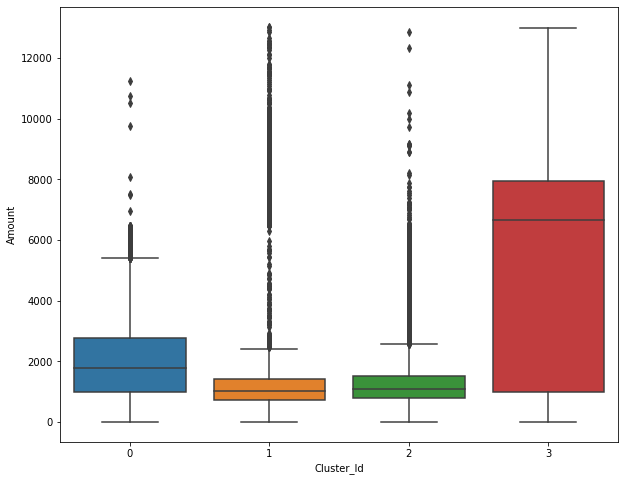

In [97]:
# Box plot для визуализации Cluster Id vs Amount

sns.boxplot(x='Cluster_Id', y='Amount', data=rfm)

<AxesSubplot:xlabel='Cluster_Id', ylabel='Frequency'>

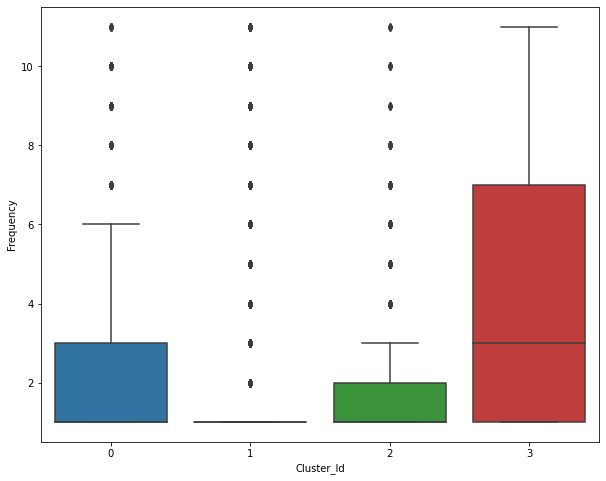

In [98]:
# Box plot для визуализации Cluster Id vs Frequency

sns.boxplot(x='Cluster_Id', y='Frequency', data=rfm)

<AxesSubplot:xlabel='Cluster_Id', ylabel='Recency'>

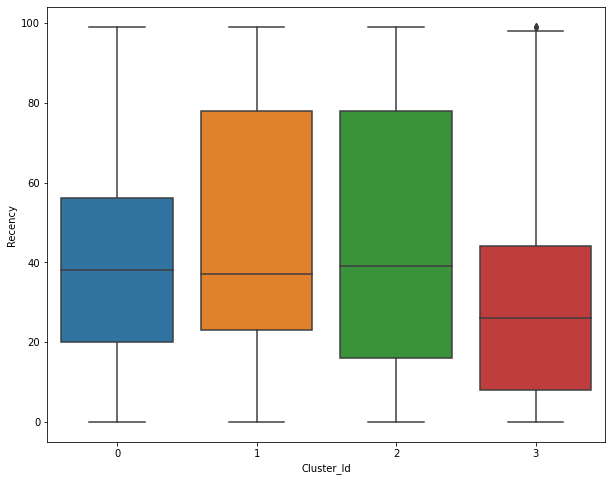

In [99]:
# Box plot для визуализации Cluster Id vs Recency

sns.boxplot(x='Cluster_Id', y='Recency', data=rfm)

### Выводы по k-means
- 0 Кластер - Кластер со средней суммой транзакций(~3000р), частотой 3 заказа и давностью 10-30 дней
- 1 Кластер - Кластер с низкой  суммой транзакций(~1000р), частотой 1 заказ и давностью последнего заказа 50-90 дней назад
- 2 Кластер - кластер с самой большой суммой транзакций(6000-8000р), частотой (в стреднем 6 транзакций за 3 месяца),  показателем "недавности" - в среднем 10 дней
- 3 Кластер - Кластер с низкой  суммой транзакций(~1000р), низкой частотой (1-2 раза) и давностью последнего заказа в среднем 20 дней назад


### Иерархическая кластеризация

Иерархическая кластеризация включает создание кластеров, которые имеют заранее определенный порядок сверху вниз. Например, все файлы и папки на жестком диске организованы в иерархию. Есть два типа иерархической кластеризации:
- Разделительный
- Агломеративный

**Single Linkage:<br>**

1.	Одиночная связь (расстояния ближайшего соседа)
В этом методе расстояние между двумя кластерами определяется расстоянием между двумя наиболее близкими объектами (ближайшими соседями) в различных кластерах. Результирующие кластеры имеют тенденцию объединяться в цепочки.



![](https://www.saedsayad.com/images/Clustering_single.png)

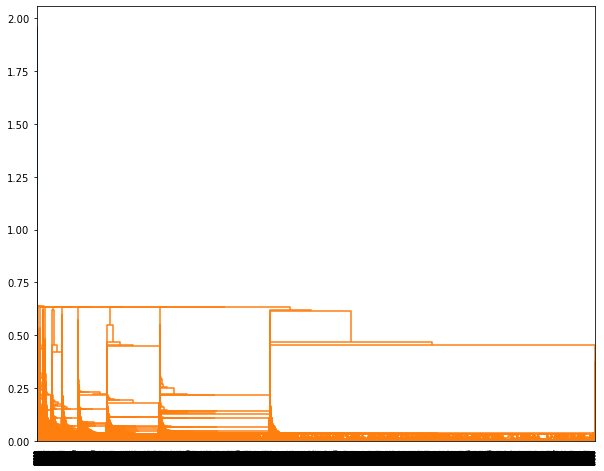

In [40]:
## Single linkage: 

mergings = linkage(rfm_df_scaled, method="single", metric='euclidean')
dendrogram(mergings)
plt.show()

**Complete Linkage<br>**

2.	Полная связь (расстояние наиболее удаленных соседей)
В этом методе расстояния между кластерами определяются наибольшим расстоянием между любыми двумя объектами в различных кластерах (т.е. наиболее удаленными соседями). Этот метод обычно работает очень хорошо, когда объекты происходят из отдельных групп. Если же кластеры имеют удлиненную форму или их естественный тип является «цепочечным», то этот метод непригоден.



![](https://www.saedsayad.com/images/Clustering_complete.png)

**Average Linkage:<br>**

Метод средней связи (average linkage) действует аналогично. Однако в этом методе рас­стояние между двумя кластерами определяют как среднее значение всех расстояний, изме->енных между объектами двух кластеров, при этом в каждую пару входят объекты из разных сластеров  в различных кластерах. Результирующие кластеры имеют тенденцию объединяться в цепочки.
nt in one cluster to every point in the other cluster. For example, the distance between clusters “r” and “s” to the left is equal to the average length each arrow between connecting the points of one cluster to the other.
![](https://www.saedsayad.com/images/Clustering_average.png)


In [41]:
# Cutting the Dendrogram based on K
# 3 clusters
cluster_labels = cut_tree(mergings, n_clusters=3).reshape(-1, )
cluster_labels

array([0, 0, 0, ..., 0, 0, 0])

<AxesSubplot:xlabel='Cluster_Labels', ylabel='Frequency'>

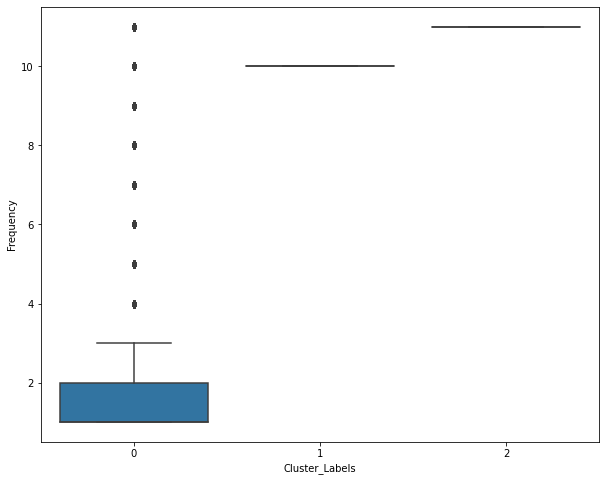

In [44]:
# Plot Cluster Id vs Frequency

sns.boxplot(x='Cluster_Labels', y='Frequency', data=rfm)

<AxesSubplot:xlabel='Cluster_Labels', ylabel='Recency'>

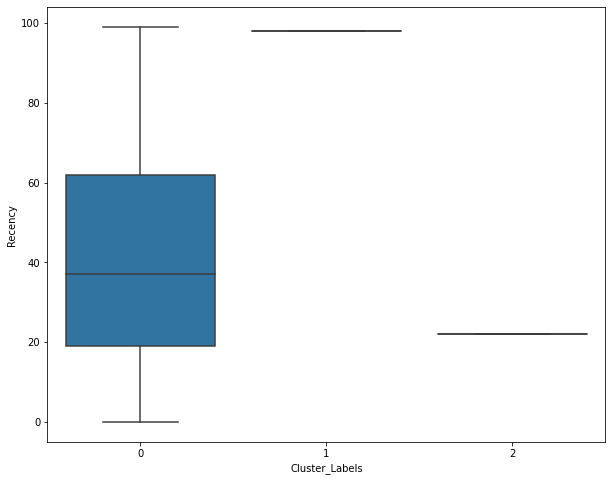

In [45]:
# Plot Cluster Id vs Recency

sns.boxplot(x='Cluster_Labels', y='Recency', data=rfm)

Тут будет вывод 


In [47]:

rfm.to_csv('rfm-table.csv', sep=',')